<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/Linear_Regression_Case_Study_NYC_Property_Sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NYC Property Sales - Case study: Linear regression model to predict sales price of properties

## Business Objective 

This dataset contains properties sold in New York City over a 12-month period from September 2016 to September 2017. The objective is to build a model to predict sale value in the future.

## Load Dataset

In [ ]:
!pip -q install pandas_profiling==2.5.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


In [ ]:
#Download dataset # bash commndas 
import pandas as pd
import requests
import pandas_profiling


!wget -q https://www.dropbox.com/s/6tc7e6rc395c7jz/nyc-property-sales.zip


In [ ]:
#Unzip the data  # bash commands 
!unzip nyc-property-sales.zip > /dev/null; echo "Done."

replace nyc-rolling-sales.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
Done.


In [ ]:
!ls

nyc-property-sales.zip	  nyc-rolling-sales.csv  sample_data
nyc-property-sales.zip.1  property_data.html


In [ ]:
#Install Packages
!pip -q install imgaug==0.2.5
!pip -q install plotly-express
!pip -q install shap
!pip -q install eli5
!pip -q install lime

## Import Packages

In [ ]:
#Import basic packages

import warnings
warnings.filterwarnings("ignore")
import time
import pandas as pd               
import numpy as np
import pickle

from sklearn.model_selection import train_test_split   #splitting data
from pylab import rcParams

# sklearn -- scikit learn -- ML Model Library - ALL ML Models (Big Ones) are present here. 

from sklearn.linear_model import LinearRegression         #linear regression
from sklearn.metrics.regression import mean_squared_error #error metrics
from sklearn.metrics import mean_absolute_error

import seaborn as sns                       #vis  ualisation
import matplotlib.pyplot as plt             #visualisation

%matplotlib inline   
# for you to show any graph on Notebooks - you need this magic fucntion    
sns.set(color_codes=True)
import plotly_express as px



In [ ]:
# Code for displaying plotly express plots inline in colab
# def configure_plotly_browser_state():
#   import IPython
#   display(IPython.core.display.HTML('''
#         <script src="/static/components/requirejs/require.js"></script>
#         <script>
#           requirejs.config({
#             paths: {
#               base: '/static/base',
#               plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
#             },
#           });
#         </script>
#         '''))
  


# Load Data



## 1. Through Pandas

In [ ]:
# Read data through Pandas and compute time taken to read

t_start = time.time()
df_prop = pd.read_csv('nyc-rolling-sales.csv')
t_end = time.time()
print('pd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_prop.head()

pd.read_csv(): 0.2989041805267334 s


,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,10009,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,10009,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00


## 2. Through Dask

In [ ]:
# Read data through Dask and compute time taken to read

import dask.dataframe as dd

t_start = time.time()
df_dask = dd.read_csv('nyc-rolling-sales.csv')
t_end = time.time()
print('dd.read_csv(): {} s'.format(t_end-t_start)) # time [s]
df_dask.tail()

dd.read_csv(): 0.020752429962158203 s


,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
84543,8409,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,34,,B9,37 QUAIL LANE,,10309,2,0,2,2400,2575,1998,1,B9,450000,2016-11-28 00:00:00
84544,8410,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,78,,B9,32 PHEASANT LANE,,10309,2,0,2,2498,2377,1998,1,B9,550000,2017-04-21 00:00:00
84545,8411,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7351,60,,B2,49 PITNEY AVENUE,,10309,2,0,2,4000,1496,1925,1,B2,460000,2017-07-05 00:00:00
84546,8412,5,WOODROW,22 STORE BUILDINGS,4,7100,28,,K6,2730 ARTHUR KILL ROAD,,10309,0,7,7,208033,64117,2001,4,K6,11693337,2016-12-21 00:00:00
84547,8413,5,WOODROW,35 INDOOR PUBLIC AND CULTURAL FACILITIES,4,7105,679,,P9,155 CLAY PIT ROAD,,10309,0,1,1,10796,2400,2006,4,P9,69300,2016-10-27 00:00:00


In [ ]:
df_prop.shape

(84548, 22)

**Observation**: Dask is almost 10 times faster than Pandas when reading files.

## 3. Subsample into n rows

In [ ]:
# Sample n rows  #on colab no need -- on local sytem - if you dont have good ram or processor - put maybe n=10000
# n = df_prop.shape[0]
# df_prop = df_prop.sample(n)

In [ ]:
df_prop.shape

(84548, 22)

# Exploratory Data Analysis

## Let's look into summary statistics

In [ ]:
#Let's look into the total number of columns and observations in the dataset
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
Unnamed: 0                        84548 non-null int64
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
EASE-MENT                         84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GRO

In [ ]:
#Let's look into summary statistics of data
df_prop.describe()

,Unnamed: 0,BOROUGH,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,YEAR BUILT,TAX CLASS AT TIME OF SALE
count,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000
mean,10344.359878,2.998758,4237.218976,376.224015,10731.991614,2.025264,0.193559,2.249184,1789.322976,1.657485
std,7151.779436,1.289790,3568.263407,658.136814,1290.879147,16.721037,8.713183,18.972584,537.344993,0.819341
min,4.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4231.000000,2.000000,1322.750000,22.000000,10305.000000,0.000000,0.000000,1.000000,1920.000000,1.000000
50%,8942.000000,3.000000,3311.000000,50.000000,11209.000000,1.000000,0.000000,1.000000,1940.000000,2.000000
75%,15987.250000,4.000000,6281.000000,1001.000000,11357.000000,2.000000,0.000000,2.000000,1965.000000,2.000000
max,26739.000000,5.000000,16322.000000,9106.000000,11694.000000,1844.000000,2261.000000,2261.000000,2017.000000,4.000000


**Observation:** 
- There is a column called Unnamed: 0 which is not required as it contains only continuous index numbers
- The datatypes of saleprice is not correct because the summary statistics of sale price is not displayed, as it is in string format, need to change the format to float.

Hence there is a lot of data cleaning to perform.

## Data Cleaning

#### Pandas profiling

In [ ]:
#Perform Pandas profiling to understand quick overview of columns

import pandas_profiling
report = pandas_profiling.ProfileReport(df_prop)
#covert profile report as html file
report.to_file("property_data.html")

In [ ]:
from IPython.display import display,HTML,IFrame

display(HTML(open('property_data.html').read()))

Number of variables,22
Number of observations,84548
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,71.7 MiB
Average record size in memory,888.6 B
CAT,13
NUM,9
Analysis started,2020-06-23 22:17:16.753207


**Observation:**
- From Pandas profiling we understand EASEMENT column has no significant value and thus has to be removed.
- From Pandas profiling we understand SALE PRICE columns have string value in some rows and thus has to be removed.

- From Pandas Profiling we understand LAND SQUARE FEET and GROSS SQUARE FEET columns have string values which have to replaced by appropriate values 

In [ ]:
#@title Saving a copy of data before making any changes

df_prop1 = df_prop.copy()

#### Removal of unnecessary columns

In [ ]:
# Let's explore why EASE-MENT has to be rejected
df_prop['EASE-MENT'].value_counts().unique()


array([84548])

In [ ]:
unique, counts = np.unique(df_prop['EASE-MENT'], return_counts=True) # this shows all the value in "Ease-ment" is '-'
dict(zip(unique, counts))

{' ': 84548}

In [ ]:
print(df_prop.columns)
print(df_prop.shape)

Index(['Unnamed: 0', 'BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'EASE-MENT',
       'BUILDING CLASS AT PRESENT', 'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE',
       'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'SALE DATE'],
      dtype='object')
(84548, 22)


In [ ]:
df_prop.head()

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,10009,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,10009,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00


In [ ]:
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
Unnamed: 0                        84548 non-null int64
BOROUGH                           84548 non-null int64
NEIGHBORHOOD                      84548 non-null object
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BLOCK                             84548 non-null int64
LOT                               84548 non-null int64
EASE-MENT                         84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
ADDRESS                           84548 non-null object
APARTMENT NUMBER                  84548 non-null object
ZIP CODE                          84548 non-null int64
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
TOTAL UNITS                       84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GRO

In [ ]:
# Unnamed: 0 -  This column has no significance other than being an iterator

# Most of the features are just the part of address to locate the unit for parcel delivery service, hence has no significans for sales price prediction

del df_prop['Unnamed: 0']
del df_prop['EASE-MENT']
del df_prop['ADDRESS']
del df_prop['APARTMENT NUMBER']
del df_prop['ZIP CODE']
del df_prop['TOTAL UNITS']
del df_prop['NEIGHBORHOOD']
del df_prop['BLOCK']
del df_prop['LOT']

df_prop.info()
# Few other featrures which are not important for prediction will be dropped in later stages while model building

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 13 columns):
BOROUGH                           84548 non-null int64
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GROSS SQUARE FEET                 84548 non-null object
YEAR BUILT                        84548 non-null int64
TAX CLASS AT TIME OF SALE         84548 non-null int64
BUILDING CLASS AT TIME OF SALE    84548 non-null object
SALE PRICE                        84548 non-null object
SALE DATE                         84548 non-null object
dtypes: int64(5), object(8)
memory usage: 8.4+ MB


In [ ]:
df_prop.shape

(84548, 13)

In [ ]:
#@title Save Copy after dropping columns
df_prop2 = df_prop.copy() # we now have only 13 columns out of 22 columns

In [ ]:
# remove rows where residential units that are greater than 0.95 quantile?
# remove rows where commericial units that are greater than 0.95 quantile?

# Gross SqFeet & Total SqFeet --> take values greater than 0 & remove '-'
# Year Built --    YB > 0  ; 1111		 1680   - start with 1800

# TAX CLASS AT TIME OF SALE category 
# SALE PRICE --- convert this numeric 

# Date --> Date forma t----> extract Month, Week & Year ?

In [ ]:
df_prop['SALE PRICE'].value_counts().index[0] #This is to find the exact value in the column

' -  '

In [ ]:
# iteration 1 -- you replace the values which are "-" with NaN

df_prop['SALE PRICE'] = df_prop['SALE PRICE'].replace(' -  ', np.nan)
df_prop['LAND SQUARE FEET'] = df_prop['LAND SQUARE FEET'].replace(' -  ', np.nan)
df_prop['GROSS SQUARE FEET'] = df_prop['GROSS SQUARE FEET'].replace(' -  ', np.nan)
#df_prop.dropna(inplace=True) #drop all na values in entire dataframe

# This is also correct 
# df[df['SALE PRICE']!=' -  ']

# iteration 2 - you add some logic to impute the value of NAN and then see your accuracy?

In [ ]:
# count the number of NaN values in each column
print(df_prop.isnull().sum())

BOROUGH                               0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BUILDING CLASS AT PRESENT             0
RESIDENTIAL UNITS                     0
COMMERCIAL UNITS                      0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                 27612
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
dtype: int64


In [ ]:
## Iteration 2 - Replace missing values of Land and gross sqft by its median

''' Define a function 'impute_median' which will impute median and fill NA values 
of 'land square feet' and 'gross square feet' with median values'''

def impute_median(Series):
    return Series.fillna(Series.median())


# Apply sends the row value --- Transform sends the series value 
df_prop['LAND SQUARE FEET'] = df_prop['LAND SQUARE FEET'].transform(impute_median)
df_prop['GROSS SQUARE FEET'] = df_prop['GROSS SQUARE FEET'].transform(impute_median)

#WE can also use the below equation instead of the above 
# df_prop['GROSS SQUARE FEET'].fillna(df_prop['GROSS SQUARE FEET'].median(), replace=True)


## Iteration 3

# Imputing these values with a better median - maybe median for zip code, appartment number etc.

In [ ]:
# check if any Nan remains
print(df_prop.isnull().sum())

BOROUGH                               0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BUILDING CLASS AT PRESENT             0
RESIDENTIAL UNITS                     0
COMMERCIAL UNITS                      0
LAND SQUARE FEET                      0
GROSS SQUARE FEET                     0
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
dtype: int64


In [ ]:
# No NaN only remains for sales price, however i will not replace/fillna because its the feature that has ot be predicted

# There are some column which are suppose to be category but are int64 and vice-versa
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 13 columns):
BOROUGH                           84548 non-null int64
BUILDING CLASS CATEGORY           84548 non-null object
TAX CLASS AT PRESENT              84548 non-null object
BUILDING CLASS AT PRESENT         84548 non-null object
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
LAND SQUARE FEET                  84548 non-null object
GROSS SQUARE FEET                 84548 non-null object
YEAR BUILT                        84548 non-null int64
TAX CLASS AT TIME OF SALE         84548 non-null int64
BUILDING CLASS AT TIME OF SALE    84548 non-null object
SALE PRICE                        69987 non-null object
SALE DATE                         84548 non-null object
dtypes: int64(5), object(8)
memory usage: 8.4+ MB


**Observation:**
- BOROUGH need to be converted to category and then we can assign value as it is equivalant to city/town name.
- BUILDING CLASS CATEGORY, TAX CLASS AT PRESENT, BUILDING CLASS AT PRESENT, TAX CLASS AT TIME OF SALE,  need to be converted from string to category 
- SALE DATE need to be converted to datetime datatype to get insights.
- LAND SQUARE FEET, GROSS SQUARE FEET and SALE PRICE needs to be converted to float


### Converting Datatype

In [ ]:
#@title Converting Datetime
# Convert sale date into datetime datatype to get insights 

df_prop['SALE DATE']=pd.to_datetime(df_prop['SALE DATE']) #This changes the data to pandas datetime type

df_prop['sales_year']=df_prop['SALE DATE'].dt.year #Now extracting 'year' from pandas datetime
# df_prop['sales_month']=df_prop['SALE DATE'].dt.month #Extracting 'month' from pandas datetime (Dont need this now)
# df_prop['sales_day']=df_prop['SALE DATE'].dt.day #Extracting 'day' from pandas datetime (Dont need this now)
# df_prop['sales_time']=df_prop['SALE DATE'].dt.hour  #Extracting 'hour' from pandas datetime (Dont need this now)
df_prop['sales_day_week']=df_prop['SALE DATE'].dt.weekday_name #Extracting 'weekday_name' from pandas datetime

del df_prop['SALE DATE'] #(Dont need this now)


In [ ]:
#Converting few column datatypes into appropriate ones for conserving memory

df_prop['BUILDING CLASS CATEGORY'] = df_prop['BUILDING CLASS CATEGORY'].astype('category')
df_prop['BUILDING CLASS AT PRESENT'] = df_prop['BUILDING CLASS AT PRESENT'].astype('category')
df_prop['BUILDING CLASS AT TIME OF SALE'] = df_prop['BUILDING CLASS AT TIME OF SALE'].astype('category')
df_prop['TAX CLASS AT TIME OF SALE'] = df_prop['TAX CLASS AT TIME OF SALE'].astype('category')
df_prop['TAX CLASS AT PRESENT'] = df_prop['TAX CLASS AT PRESENT'].astype('category')
df_prop['BOROUGH'] = df_prop['BOROUGH'].astype('category')
df_prop['sales_day_week'] = df_prop['sales_day_week'].astype('category')


df_prop['LAND SQUARE FEET'] = pd.to_numeric(df_prop['LAND SQUARE FEET'], errors='coerce')
df_prop['GROSS SQUARE FEET']= pd.to_numeric(df_prop['GROSS SQUARE FEET'], errors='coerce')
df_prop['SALE PRICE'] = pd.to_numeric(df_prop['SALE PRICE'], errors='coerce')

In [ ]:
#Checking to confirm changes
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 14 columns):
BOROUGH                           84548 non-null category
BUILDING CLASS CATEGORY           84548 non-null category
TAX CLASS AT PRESENT              84548 non-null category
BUILDING CLASS AT PRESENT         84548 non-null category
RESIDENTIAL UNITS                 84548 non-null int64
COMMERCIAL UNITS                  84548 non-null int64
LAND SQUARE FEET                  84548 non-null float64
GROSS SQUARE FEET                 84548 non-null float64
YEAR BUILT                        84548 non-null int64
TAX CLASS AT TIME OF SALE         84548 non-null category
BUILDING CLASS AT TIME OF SALE    84548 non-null category
SALE PRICE                        69987 non-null float64
sales_year                        84548 non-null int64
sales_day_week                    84548 non-null category
dtypes: category(7), float64(3), int64(4)
memory usage: 5.3 MB


In [ ]:
#Assign numbered bouroughs to bourough names
#@title Reverse label enoding --- 
dic = {1: 'Manhattan', 2: 'Bronx', 3: 'Brooklyn', 4: 'Queens', 5:'Staten Island'}
df_prop["borough_name"] = df_prop["BOROUGH"].apply(lambda x: dic[x])

df_prop.head()

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BUILDING CLASS AT PRESENT,RESIDENTIAL UNITS,COMMERCIAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,sales_year,sales_day_week,borough_name
0,1,07 RENTALS - WALKUP APARTMENTS,2A,C2,5,0,1633.0,6440.0,1900,2,C2,6625000.0,2017,Wednesday,Manhattan
3,1,07 RENTALS - WALKUP APARTMENTS,2B,C4,10,0,2272.0,6794.0,1913,2,C4,3936272.0,2016,Friday,Manhattan
4,1,07 RENTALS - WALKUP APARTMENTS,2A,C2,6,0,2369.0,4615.0,1900,2,C2,8000000.0,2016,Thursday,Manhattan
6,1,07 RENTALS - WALKUP APARTMENTS,2B,C4,8,0,1750.0,4226.0,1920,2,C4,3192840.0,2016,Friday,Manhattan
9,1,08 RENTALS - ELEVATOR APARTMENTS,2,D9,24,0,4489.0,18523.0,1920,2,D9,16232000.0,2016,Monday,Manhattan


In [ ]:
#@title Dropping NaN all rows in entire dataset
# Now only the Sales Price has NaN data which we did not replace with anything, coz thats what we need to predict.
df_prop.dropna(inplace=True)
df_prop.shape

(69987, 15)

In [ ]:
#@title Save Copy after converting feature datatype
df_prop3 = df_prop.copy()

### Removing Outliers

In [ ]:
#The datatypes have now been changed
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69987 entries, 0 to 84547
Data columns (total 15 columns):
BOROUGH                           69987 non-null category
BUILDING CLASS CATEGORY           69987 non-null category
TAX CLASS AT PRESENT              69987 non-null category
BUILDING CLASS AT PRESENT         69987 non-null category
RESIDENTIAL UNITS                 69987 non-null int64
COMMERCIAL UNITS                  69987 non-null int64
LAND SQUARE FEET                  69987 non-null float64
GROSS SQUARE FEET                 69987 non-null float64
YEAR BUILT                        69987 non-null int64
TAX CLASS AT TIME OF SALE         69987 non-null category
BUILDING CLASS AT TIME OF SALE    69987 non-null category
SALE PRICE                        69987 non-null float64
sales_year                        69987 non-null int64
sales_day_week                    69987 non-null category
borough_name                      69987 non-null category
dtypes: category(8), float64(3), int

In [ ]:
print(df_prop.isnull().sum())

BOROUGH                           0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BUILDING CLASS AT PRESENT         0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
sales_year                        0
sales_day_week                    0
borough_name                      0
dtype: int64


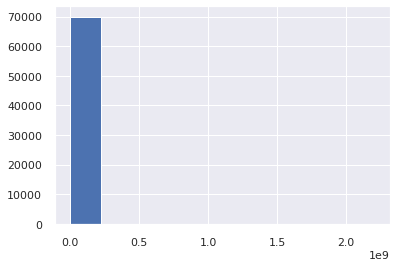

In [ ]:
# Now with histogram graph lets check if the data is normally distributed or not
df_prop['SALE PRICE'].hist()

In [ ]:
# With the graph above we see that the price value '0' has huge count
# so to understand, how a property value can be '0' and how many are they in the Sale Price. do this:
df_prop['SALE PRICE'].value_counts()

0.0          10228
10.0           766
450000.0       427
550000.0       416
650000.0       414
             ...  
5260000.0        1
1448094.0        1
2127500.0        1
734750.0         1
1038348.0        1
Name: SALE PRICE, Length: 10007, dtype: int64

In [ ]:
# Above we see that there are 10228 values which are $0

In [ ]:
1# Let's remove all nonsensically small dollar amount: $0 most commonly from Sale Price column
# Since these sales are actually transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement.

#This will remove all those rows from the dataframe which has $0 in the Sale Price column and rest data will remain as it is.
df_prop = df_prop[df_prop['SALE PRICE']!=0]
df_prop.shape

(59759, 15)

In [ ]:
#Let's also remove observations that have gross square feet less than 400 sq. ft
#Let's also remove observations that have land square feet less than 400 sq. ft
#Let's also remove observations that have sale price less than 10000 dollars

# Iteration 1
df_prop = df_prop[df_prop['GROSS SQUARE FEET']>400]
df_prop = df_prop[df_prop['LAND SQUARE FEET']>400]
df_prop = df_prop[df_prop['SALE PRICE']>10000]

#iteration 2 
# You can use other threshold 
df_prop.shape

(49856, 15)

In [ ]:
# Lets work on the SALE PRICE now
print(df_prop['SALE PRICE'].value_counts())
print("Sales Price -Skewness", df_prop['SALE PRICE'].skew())
print("Sales Price -Kurtosis", df_prop['SALE PRICE'].kurt())

450000.0     388
550000.0     374
600000.0     368
650000.0     356
700000.0     356
            ... 
475162.0       1
7340000.0      1
77500.0        1
204830.0       1
393219.0       1
Name: SALE PRICE, Length: 8738, dtype: int64
Sales Price -Skewness 107.79614052811563
Sales Price -Kurtosis 15980.6535754247


In [ ]:
# The above skew and kurt shows that the data is not normally distributed
# Moreover there are outliers in the Sales price

df_prop[df_prop['SALE PRICE']==2210000000]# Outlier in Sale Price

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BUILDING CLASS AT PRESENT,RESIDENTIAL UNITS,COMMERCIAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,sales_year,sales_day_week,borough_name
7447,1,21 OFFICE BUILDINGS,4,O4,0,35,81336.0,1586886.0,1966,4,O4,2.210000e+09,2017,Friday,Manhattan


**Observation:** The most expensive property in NYC is a whopping 2 billion dollars which can be considered as an outlier.

In [ ]:
# iteration assumption - i don't want to keep higher priced properties in my analysis - we can do a seperate analysis for high rate prop

q = df_prop["SALE PRICE"].quantile(0.95)
q

4530830.25

In [ ]:
# The quantile 0.95  shows mark of properties having price more than $4.5 million, hence we filter data less that 0.95 quantile

df_prop = df_prop[df_prop["SALE PRICE"] < q]

df_prop.shape

(47363, 15)

In [ ]:
df_prop.columns

Index(['BOROUGH', 'BUILDING CLASS CATEGORY', 'TAX CLASS AT PRESENT',
       'BUILDING CLASS AT PRESENT', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'sales_year', 'sales_day_week', 'borough_name'],
      dtype='object')

In [ ]:
df_prop = df_prop[df_prop['YEAR BUILT'] > 1800]
df_prop.shape

(45183, 15)

In [ ]:
#@title Save Copy of Cleaned Data
df_prop4 = df_prop.copy()  # For further experiment we will make and copy and use it, to keep the cleaned data as a safe copy.

In [ ]:
df_prop.head()

,BOROUGH,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BUILDING CLASS AT PRESENT,RESIDENTIAL UNITS,COMMERCIAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,sales_year,sales_day_week,borough_name
3,1,07 RENTALS - WALKUP APARTMENTS,2B,C4,10,0,2272.0,6794.0,1913,2,C4,3936272.0,2016,Friday,Manhattan
6,1,07 RENTALS - WALKUP APARTMENTS,2B,C4,8,0,1750.0,4226.0,1920,2,C4,3192840.0,2016,Friday,Manhattan
13,1,09 COOPS - WALKUP APARTMENTS,2,C6,0,0,2325.0,1680.0,1920,2,C6,499000.0,2017,Friday,Manhattan
15,1,09 COOPS - WALKUP APARTMENTS,2,C6,0,0,2325.0,1680.0,1920,2,C6,529500.0,2017,Friday,Manhattan
16,1,09 COOPS - WALKUP APARTMENTS,2,C6,0,0,2325.0,1680.0,1920,2,C6,423000.0,2017,Friday,Manhattan


# **Data Visualization**

In [ ]:
df_prop.shape

(45183, 15)

## Count of properties in NYC in each bororugh

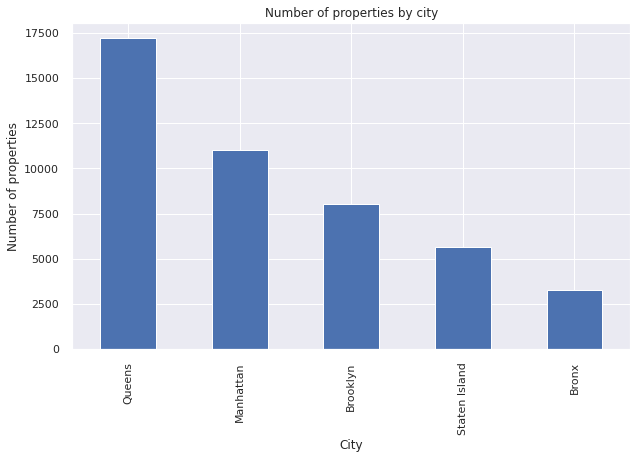

In [ ]:
# Visualizing to see maximum number of properties as per borough name / city name
%matplotlib inline
df_prop.borough_name.value_counts().nlargest(10).plot(kind='bar', figsize=(10,6))
plt.title("Number of properties by city")
plt.ylabel('Number of properties')
plt.xlabel('City');
plt.show()

**Observation:** Queens has maximum properties which is more than 17500 plus

## Distribution of Sale Price

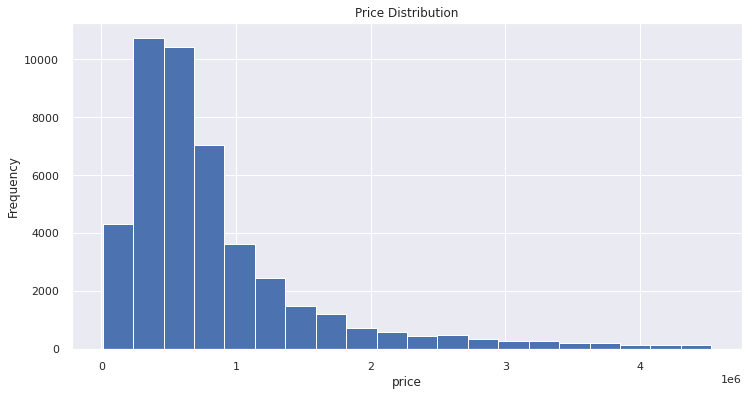

In [ ]:
# Visualizing to see Sale Price Distribution
df_prop['SALE PRICE'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('price', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

# This plot shows distribution of property sales price in millions as per the describe() module. 
# Hence graph shows data between 0 million to 4.5 million 

**Observation**: The distribution is highly skewed towards the right which implies there are **lesser properties that have a very high prices**.  


In [ ]:
df_prop['SALE PRICE'].describe()

count    4.518300e+04
mean     8.364038e+05
std      7.307508e+05
min      1.000100e+04
25%      3.950000e+05
50%      6.200000e+05
75%      9.780000e+05
max      4.530703e+06
Name: SALE PRICE, dtype: float64

**Observation**: The maximum sale price is 4.5 million

## Normalization of Data

In [ ]:
# Log Normalization is very important in Y - Class - This is Non-Normal Distribution - Do this - np.log(sales price)
# And to reverse or come back to the original value - do - np.exp(log_price)

In [ ]:
#@title Replacing spaces with underscores from features names for better coding 
df_prop.columns = df_prop.columns.str.replace(' ','_')
df_prop.columns 

Index(['BOROUGH', 'BUILDING_CLASS_CATEGORY', 'TAX_CLASS_AT_PRESENT',
       'BUILDING_CLASS_AT_PRESENT', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'sales_year', 'sales_day_week', 'borough_name'],
      dtype='object')

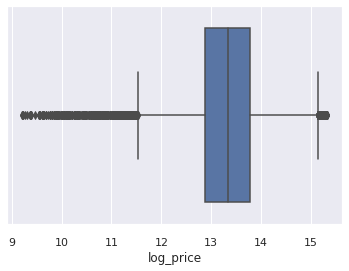

In [ ]:
df_prop["log_price"] = np.log(df_prop["SALE_PRICE"]) # This creates a new column of sales price which is log_price

# Plotting with Seaborn
sns.boxplot(x='log_price', data=df_prop) # Create a box plot to check the log price distribution 


In [ ]:
#@title Save Copy as log_price added
df_prop5 = df_prop.copy()

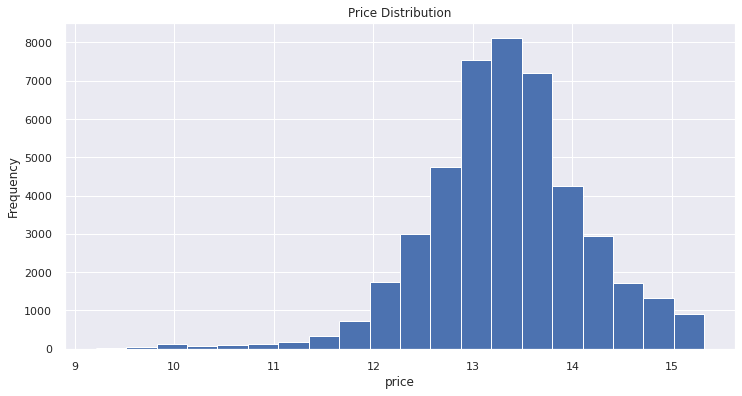

In [ ]:
# Create a hist plot to check the log price distribution again.
# Plotting with matplotlib
df_prop['log_price'].plot.hist(bins=20, figsize=(12, 6), edgecolor = 'white')
plt.xlabel('price', fontsize=12)
plt.title('Price Distribution', fontsize=12)
plt.show()

In [ ]:
# To revert to the original value from log value, we do np.exp(value)
np.exp(14)

1202604.2841647768

In [ ]:
#skewness and kurtosis    - Acceptable Range -->   -1to 1 , Kurtosis --> -5 to 5 
print("Skewness: %f" % df_prop['SALE_PRICE'].skew())
print("Kurtosis: %f" % df_prop['SALE_PRICE'].kurt())

Skewness: 2.267262
Kurtosis: 5.914797


In [ ]:
#skewness and kurtosis
print("Skewness: %f" % df_prop['log_price'].skew())
print("Kurtosis: %f" % df_prop['log_price'].kurt())

Skewness: -0.376747
Kurtosis: 1.560100


In [ ]:
# Checking
df_prop['log_price'].iloc[1000]

13.627975434117433

In [ ]:
# Cheking with above log
np.exp(df_prop['log_price'].iloc[1000])

829000.0000000007

## Correlation between selected variables

The heat map produces a correlation plot between variables of the dataframe.

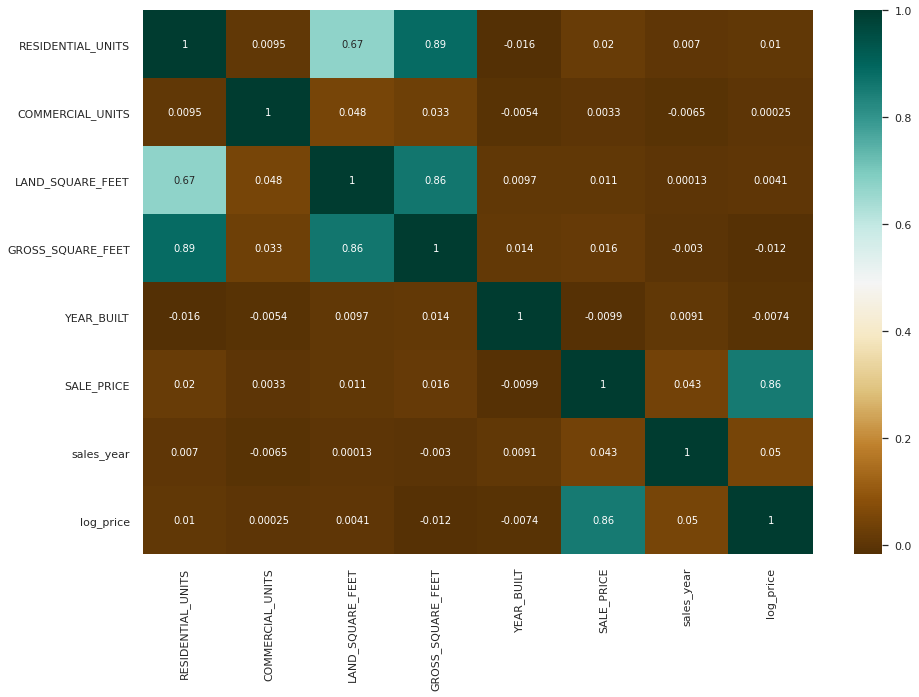

In [ ]:
plt.figure(figsize=(15,10))
c = df_prop[df_prop.columns.values[0:19]].corr()
sns.heatmap(c,cmap="BrBG",annot=True)

**Observation:** 
- Gross Sqft and Land Sqft are highly correlated, hence one can be dropped.
- Sales Price can be dropped as we have log_price
- Also, good to see that Sales price is completly independent.

In [ ]:
df_prop.columns

Index(['BOROUGH', 'BUILDING_CLASS_CATEGORY', 'TAX_CLASS_AT_PRESENT',
       'BUILDING_CLASS_AT_PRESENT', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'sales_year', 'sales_day_week', 'borough_name',
       'log_price'],
      dtype='object')

## Explore how gross square feet affects sale price 

In [ ]:
# Plotting with plotly express
import plotly_express as px
px.scatter(df_prop, x="BOROUGH", y="SALE_PRICE" ,color="borough_name", size ='GROSS_SQUARE_FEET',
           hover_data=['GROSS_SQUARE_FEET', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS' ], size_max=100)

**Observation:** 

- Properties with more total units do not fetch larger sales price
- Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

## Explore how tax class at the time of sale affect sales price

In [ ]:
df_prop.columns

Index(['BOROUGH', 'BUILDING_CLASS_CATEGORY', 'TAX_CLASS_AT_PRESENT',
       'BUILDING_CLASS_AT_PRESENT', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'sales_year', 'sales_day_week', 'borough_name',
       'log_price'],
      dtype='object')

In [ ]:
# Plotting with plotly express
px.box(df_prop, x="sales_year", y="SALE_PRICE", color="borough_name",hover_data=['YEAR_BUILT', 'GROSS_SQUARE_FEET'],notched=True)

**Observation:** 

- Manhatten has the highest priced properties that have a tax class 1 representing  residential property of up to three units (such as one-,two-, and three-family homes and small stores or offices with one or two attached apartments) as compared to other boroughs. 
- Properties in Staten Island have comparitively lesser sales price in comparison with other boroughs in New york city

## Explore how week-days effect sales in different borough

In [ ]:
# Lets Check the sales as per week days in different borough

px.box(df_prop, x="sales_day_week", y="SALE_PRICE", color="borough_name", hover_name='TAX_CLASS_AT_TIME_OF_SALE', notched=True)

**Observation:** 

- On Saturdays there are no sales for the tax class 4 which represents properties such as  such as offices, factories, warehouses, garage buildings, etc. 

# Model Building

##  Prepare the Data for model building

### Delete columns not necessary for prediction

In [ ]:
df_prop.columns

Index(['BOROUGH', 'BUILDING_CLASS_CATEGORY', 'TAX_CLASS_AT_PRESENT',
       'BUILDING_CLASS_AT_PRESENT', 'RESIDENTIAL_UNITS', 'COMMERCIAL_UNITS',
       'LAND_SQUARE_FEET', 'GROSS_SQUARE_FEET', 'YEAR_BUILT',
       'TAX_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_TIME_OF_SALE',
       'SALE_PRICE', 'sales_year', 'sales_day_week', 'borough_name',
       'log_price'],
      dtype='object')

In [ ]:
# #Dropping few columns
del df_prop['borough_name'] # Borough is enough
del df_prop['sales_year']
del df_prop['sales_day_week']

# Correlated features has to be dropped as per correlation heatmap
del df_prop['LAND_SQUARE_FEET'] # Deleting as not required, coz gross sqft is enough.
del df_prop['SALE_PRICE'] # log_price is enough for model


In [ ]:
#@title Save Copy as features deleted for Model
df_prop6 = df_prop.copy()

In [ ]:
df_prop.shape

(45183, 11)

# Feature Engineering

## Label Encoding Categorical Features

In [ ]:
# Lets check which features needs to be encoded for model
df_prop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45183 entries, 3 to 84547
Data columns (total 11 columns):
BOROUGH                           45183 non-null category
BUILDING_CLASS_CATEGORY           45183 non-null category
TAX_CLASS_AT_PRESENT              45183 non-null category
BUILDING_CLASS_AT_PRESENT         45183 non-null category
RESIDENTIAL_UNITS                 45183 non-null int64
COMMERCIAL_UNITS                  45183 non-null int64
GROSS_SQUARE_FEET                 45183 non-null float64
YEAR_BUILT                        45183 non-null int64
TAX_CLASS_AT_TIME_OF_SALE         45183 non-null category
BUILDING_CLASS_AT_TIME_OF_SALE    45183 non-null category
log_price                         45183 non-null float64
dtypes: category(6), float64(2), int64(3)
memory usage: 2.4 MB


In [ ]:
#Select the variables for label encoding all categorical features

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

features = ['BUILDING_CLASS_AT_TIME_OF_SALE', 'BUILDING_CLASS_AT_PRESENT', 'TAX_CLASS_AT_PRESENT', 'BUILDING_CLASS_CATEGORY', 
                 'TAX_CLASS_AT_TIME_OF_SALE']

df = df_prop[features].apply(le.fit_transform)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45183 entries, 3 to 84547
Data columns (total 5 columns):
BUILDING_CLASS_AT_TIME_OF_SALE    45183 non-null int64
BUILDING_CLASS_AT_PRESENT         45183 non-null int64
TAX_CLASS_AT_PRESENT              45183 non-null int64
BUILDING_CLASS_CATEGORY           45183 non-null int64
TAX_CLASS_AT_TIME_OF_SALE         45183 non-null int64
dtypes: int64(5)
memory usage: 2.1 MB


In [ ]:
# Replacing categorical columns with encoded features
fdf = df_prop.drop(features, axis=1) # These are original features whcih we encoded hence dropping them
fdf = pd.concat([fdf, df], axis=1) #These are new encoded features whcich we are not concatinating/merging with orignal data
fdf.shape

(45183, 11)

In [ ]:
fdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45183 entries, 3 to 84547
Data columns (total 11 columns):
BOROUGH                           45183 non-null category
RESIDENTIAL_UNITS                 45183 non-null int64
COMMERCIAL_UNITS                  45183 non-null int64
GROSS_SQUARE_FEET                 45183 non-null float64
YEAR_BUILT                        45183 non-null int64
log_price                         45183 non-null float64
BUILDING_CLASS_AT_TIME_OF_SALE    45183 non-null int64
BUILDING_CLASS_AT_PRESENT         45183 non-null int64
TAX_CLASS_AT_PRESENT              45183 non-null int64
BUILDING_CLASS_CATEGORY           45183 non-null int64
TAX_CLASS_AT_TIME_OF_SALE         45183 non-null int64
dtypes: category(1), float64(2), int64(8)
memory usage: 3.8 MB


### Standardization & Splitting data into independent feature 'X'  and dependent fearure/label to be predicted as 'y'

In [ ]:
# so we have 11 features in all now
fdf.shape

(45183, 11)

In [ ]:
#Standardize rows into uniform scale

X = fdf.drop(['log_price'], axis=1)
y = fdf['log_price'] # No need to normalise the log_price as it is already being normalised by log

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)

# Scale and center the data
fdf_normalized = scaler.transform(X)

# Create a pandas DataFrame
X = pd.DataFrame(data=fdf_normalized, index=X.index, columns=X.columns)

In [ ]:
X.head()

,BOROUGH,RESIDENTIAL_UNITS,COMMERCIAL_UNITS,GROSS_SQUARE_FEET,YEAR_BUILT,BUILDING_CLASS_AT_TIME_OF_SALE,BUILDING_CLASS_AT_PRESENT,TAX_CLASS_AT_PRESENT,BUILDING_CLASS_CATEGORY,TAX_CLASS_AT_TIME_OF_SALE
3,-1.492142,0.822121,-0.011565,0.214413,-1.101219,-0.344783,-0.352366,1.750662,0.102136,0.952221
6,-1.492142,0.630490,-0.011565,0.087092,-0.883734,-0.344783,-0.352366,1.750662,0.102136,0.952221
13,-1.492142,-0.136038,-0.011565,-0.039138,-0.883734,-0.283220,-0.291478,0.881868,0.425549,0.952221
15,-1.492142,-0.136038,-0.011565,-0.039138,-0.883734,-0.283220,-0.291478,0.881868,0.425549,0.952221
16,-1.492142,-0.136038,-0.011565,-0.039138,-0.883734,-0.283220,-0.291478,0.881868,0.425549,0.952221


In [ ]:
#@title To reverse standardization, we do this:
pd.DataFrame(scaler.inverse_transform(X))

,0,1,2,3,4,5,6,7,8,9
0,1.0,1.000000e+01,1.387779e-17,6794.0,1913.0,17.0,18.0,7.0,6.0,1.0
1,1.0,8.000000e+00,1.387779e-17,4226.0,1920.0,17.0,18.0,7.0,6.0,1.0
2,1.0,2.220446e-16,1.387779e-17,1680.0,1920.0,19.0,20.0,5.0,8.0,1.0
3,1.0,2.220446e-16,1.387779e-17,1680.0,1920.0,19.0,20.0,5.0,8.0,1.0
4,1.0,2.220446e-16,1.387779e-17,1680.0,1920.0,19.0,20.0,5.0,8.0,1.0
...,...,...,...,...,...,...,...,...,...,...
45178,5.0,2.000000e+00,1.387779e-17,2160.0,1994.0,10.0,11.0,1.0,1.0,0.0
45179,5.0,2.000000e+00,1.387779e-17,2575.0,1998.0,12.0,13.0,1.0,1.0,0.0
45180,5.0,2.000000e+00,1.387779e-17,2377.0,1998.0,12.0,13.0,1.0,1.0,0.0
45181,5.0,2.000000e+00,1.387779e-17,1496.0,1925.0,10.0,11.0,1.0,1.0,0.0


# Feature Importance

[0.2043324  0.01860485 0.00826423 0.27691478 0.17083539 0.07424898
 0.07786414 0.05982342 0.07587983 0.03323198]


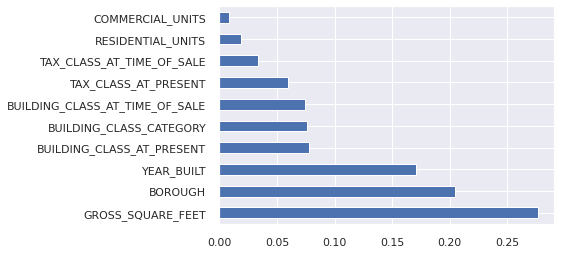

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

model = ExtraTreesRegressor()
model.fit(X, y)

print(model.feature_importances_) #using inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [ ]:
# Lets pick the top 8 features which are important and drop the rest
del X['RESIDENTIAL_UNITS']
del X['COMMERCIAL_UNITS']


### Split the data into train and test

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state=11) # 75-25 by default

### Train the model

In [ ]:
# initialize the model
lr= LinearRegression()

# fit the model
model_fit=lr.fit(X_train,y_train)

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score

#predict on train data
y_train_pred = model_fit.predict(X_train)

#mean squared error
mse=mean_squared_error(y_train, y_train_pred)
print('train mse: {}'.format(mse))

#root mean squared error
print('train rmse: {}'.format(np.sqrt(mse)))

#mean absolute error
mae=mean_absolute_error(y_train, y_train_pred)
print('train mae: {}'.format(mae))

#explained_variance_score
evs = explained_variance_score(y_train, y_train_pred)
print("Explained Variance Score: {}".format(evs))

#r2_score
r2 = r2_score(y_train, y_train_pred)
print('r2_score: {}'.format(r2))

#bias
bias = y_train_pred - y_train.mean()
print("Bias: " + str(bias.mean()))

#Varience
var = np.var([y_train, y_train_pred], axis=0)
print("Variance: " + str(var.mean()))                                             # Calculate Variance
    

train mse: 0.5340130720686214
train rmse: 0.7307619804482314
train mae: 0.5520042697250533
Explained Variance Score: 0.15499732920266396
r2_score: 0.15499732920266407
Bias: -5.309504083531779e-13
Variance: 0.13350326801715534


### Test the model

In [ ]:
#predict on test data
y_test_pred = model_fit.predict(X_test)

In [ ]:
#predict on test data
y_train_pred = model_fit.predict(X_train)

#mean squared error
mse=mean_squared_error(y_test, y_test_pred)
print('train mse: {}'.format(mse))

#root mean squared error
print('train rmse: {}'.format(np.sqrt(mse)))

#mean absolute error
mae=mean_absolute_error(y_test, y_test_pred)
print('train mae: {}'.format(mae))

#explained_variance_score
evs = explained_variance_score(y_test, y_test_pred)
print("Explained Variance Score: {}".format(evs))

#r2_score
r2 = r2_score(y_test, y_test_pred)
print('r2_score: {}'.format(r2))

#bias
bias = y_test_pred - y_test.mean()
print("Bias: " + str(bias.mean()))

#Varience
var = np.var([y_test, y_test_pred], axis=0)
print("Variance: " + str(var.mean()))                                             # Calculate Variance
    

train mse: 0.552179896082249
train rmse: 0.7430880809717305
train mae: 0.5574591885004896
Explained Variance Score: 0.1447214730371016
r2_score: 0.14467140768645903
Bias: -0.005685156591975153
Variance: 0.13804497402056226


In [ ]:
np.exp(y_test_pred[5])

504138.77190199617

In [ ]:
np.exp(y_test)

26970    1425000.0
28119    1418000.0
77289     490000.0
68044     192000.0
68666     490000.0
           ...    
71930     230000.0
18512     395200.0
62501     211732.0
60999     918303.0
65833     331000.0
Name: log_price, Length: 13555, dtype: float64

In [ ]:
y_test_pred.shape

(13555,)

# Model Explainability

### LIME

In [ ]:
# Import lime package
import lime
import lime.lime_tabular

#Find caegorical features
categorical_features = np.argwhere(np.array([len(set(X_test.values[:,x])) for x in range(X_test.values.shape[1])]) <= 10).flatten()

#Lime explainer for regression
explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values, 
                                                   feature_names=X_test.columns.values.tolist(), 
                                                   class_names=['PriceCrore'], categorical_features=categorical_features, 
                                                   verbose=True, mode='regression')
ind = 15

#Fit on test data
exp = explainer.explain_instance(X_test.values[ind], model_fit.predict, num_features=6)

#Show in notebook features influencing predictions
exp.show_in_notebook(show_table=True)

Intercept 13.481264640502447
Prediction_local [13.25812345]
Right: 13.2487427149901


### ELI5

In [ ]:
# Import Eli5 package
import eli5
from eli5.sklearn import PermutationImportance

# Find the importance of columns for prediction
perm = PermutationImportance(model_fit, random_state=1).fit(X_test,y_test_pred)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Using TensorFlow backend.


Weight,Feature
5.9094 ± 0.0895,TAX_CLASS_AT_TIME_OF_SALE
3.2507 ± 0.0547,TAX_CLASS_AT_PRESENT
1.6243 ± 0.0333,BOROUGH
1.4648 ± 0.0206,BUILDING_CLASS_AT_TIME_OF_SALE
0.4027 ± 0.0080,BUILDING_CLASS_AT_PRESENT
0.0848 ± 0.0001,GROSS_SQUARE_FEET
0.0099 ± 0.0001,BUILDING_CLASS_CATEGORY
0.0002 ± 0.0000,YEAR_BUILT


In [ ]:
#Understanding how each feature influences the prediction
eli5.show_prediction(model_fit, doc=X_test.iloc[[ind]], feature_names=list(X_test.columns))

### SHAP

In [ ]:
#Import SHAP package
import shap

#Create explainer for linear model
explainer = shap.LinearExplainer(model_fit,data=X_test.values)
shap_values = explainer.shap_values(X_test)

In [ ]:
#Understanding how each feature influences the prediction

shap.initjs()
ind = 11


shap.force_plot(
    explainer.expected_value, shap_values[ind,:], X_test.iloc[ind,:],
    feature_names=X_test.columns.tolist()
)

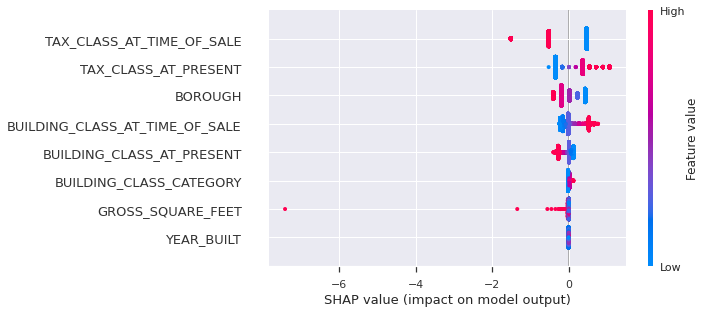

In [ ]:
shap.summary_plot(shap_values,X_test)


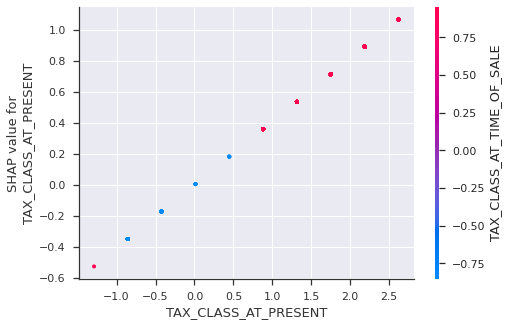

In [ ]:
shap.dependence_plot("TAX_CLASS_AT_PRESENT", shap_values, X_test)